In [38]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import time

from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from causalnex.structure.notears import from_pandas
from causalnex.structure import StructureModel
import networkx as nx
from IPython.display import Image
from causalnex.plots import plot_structure, NODE_STYLE, EDGE_STYLE
import warnings
warnings.filterwarnings('ignore')
BETA = 10
RATIO = 0.30
FEATURES='fs_voted'

In [2]:
def get_features():
    """
    this method gets a set of features from our previous feature analysis
    """
    features = {
        # 1. Features selected from correlations
        "fs_corr" : ['texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean','symmetry_mean',
                         'fractal_dimension_mean', 'texture_se', 'area_se','smoothness_se', 'concavity_se',
                         'symmetry_se', 'fractal_dimension_se','smoothness_worst', 'concavity_worst', 
                         'symmetry_worst', 'fractal_dimension_worst'],

        # 2. Univariate feature selection SelectKBest, chi2
        "fs_chi2" : ['texture_mean', 'area_mean', 'concavity_mean', 'symmetry_mean', 'area_se', 
                         'concavity_se', 'smoothness_worst', 'concavity_worst', 'symmetry_worst', 
                         'fractal_dimension_worst'],

        # 3. Recursive feature elimination (RFE) with random forest
        "fs_rfe" : ['texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean', 'area_se', 
                  'smoothness_se', 'concavity_se', 'smoothness_worst', 'concavity_worst', 'symmetry_worst'],

        # 4. Recursive feature elimination with cross validation(RFECV) with random forest
        "fs_rfecv" : ['texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean','fractal_dimension_mean'
                    , 'area_se', 'concavity_se', 'concavity_worst', 'symmetry_worst'],

        # 5. Tree based feature selection with random forest classification
        "fs_rf" : ['texture_mean', 'area_mean', 'concavity_mean', 'area_se', 'concavity_se', 
                 'fractal_dimension_se', 'smoothness_worst','concavity_worst', 'symmetry_worst', 
                 'fractal_dimension_worst'],

        # 6. ExtraTree based feature selection 
        "fs_extraTree" : ['texture_mean', 'area_mean', 'concavity_mean', 'fractal_dimension_mean', 'area_se', 
                        'concavity_se','smoothness_worst', 'concavity_worst', 
                        'symmetry_worst','fractal_dimension_worst'],

        # 7. L1 feature selection (LinearSVC)
        "fs_l1" : ['texture_mean', 'area_mean', 'area_se'],

        # 8. Vote based feature selection
        "fs_voted" : ['texture_mean',  'area_mean',  'smoothness_mean',  'concavity_mean',  
                         'fractal_dimension_mean',  'area_se',  'concavity_se',  'smoothness_worst',  
                         'concavity_worst',  'symmetry_worst',  'fractal_dimension_worst'],

        
    }
    return features

In [3]:
features = get_features();

In [4]:
def load_data(filename,ratio):
    """
    returns complete dataset as split dataset
    
    args:
        model_full (pd.DataFrame): a pandas dataframe containing complete dataset
    
    returns:
        split dataset in form of train and test datasets
    """
    global feature_names, response_name, n_features, model_full  
    model_full = pd.read_csv(filename)
     
    # we change the class values (at the column number 2) from B to 0 and from M to 1
    model_full.iloc[:,1].replace('B', 0,inplace=True)
    model_full.iloc[:,1].replace('M', 1,inplace=True)
    response_name = ['diagnosis']
    drop_list = ['Unnamed: 32','id','diagnosis']
    model_full_x= model_full.drop(drop_list,axis = 1)
    X = model_full_x
    y = model_full.diagnosis
    
    X_train, X_test, y_train, y_test = train_test_split(X,
                                                        y,
                                                        test_size = ratio,
                                                        random_state = 12345)
    return X_train, y_train, X_test, y_test

In [5]:
x_train, y_train, x_test, y_test = load_data('../data/data.csv',RATIO)

In [6]:
y_train.shape

(398,)

In [7]:
# Voted
y = pd.DataFrame(y_train,columns=['diagnosis'])
x_train = x_train.join(y)
X_train = x_train[features[FEATURES]]
X_test = x_test[features[FEATURES]]
y_2 = pd.DataFrame(y_test,columns=['diagnosis'])

# scaling data
cols = X_train.columns
print('------columns------')
print(cols)
print('--------------------')
sc = MinMaxScaler()
X_train = pd.DataFrame(sc.fit_transform(X_train), columns=cols)
X_test = pd.DataFrame(sc.transform(X_test), columns=cols)
X_train['diagnosis'] = x_train['diagnosis']
print('Size of data:')
print ('The train data has {0} rows and {1} columns'.format(X_train.shape[0],X_train.shape[1]))
print ('----------------------------')
print ('The test data has {0} rows and {1} columns'.format(X_test.shape[0],X_test.shape[1]))

------columns------
Index(['texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean',
       'fractal_dimension_mean', 'area_se', 'concavity_se', 'smoothness_worst',
       'concavity_worst', 'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')
--------------------
Size of data:
The train data has 398 rows and 12 columns
----------------------------
The test data has 171 rows and 11 columns


In [8]:
X_train

,texture_mean,area_mean,smoothness_mean,concavity_mean,fractal_dimension_mean,area_se,concavity_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,0.871784,0.162155,0.359484,0.066050,0.226365,0.041330,0.051700,0.312640,0.072887,0.149917,0.232044,1.0
1,0.368880,0.017328,0.494448,0.000000,0.524412,0.020560,0.000000,0.431502,0.000000,0.374673,0.279179,1.0
2,0.611203,0.097155,0.640697,0.105787,0.534621,0.026425,0.121498,0.717449,0.145192,0.294132,0.477341,1.0
3,0.041909,0.098319,0.300984,0.032029,0.245007,0.004923,0.065342,0.258303,0.086636,0.433595,0.206285,NaN
4,0.395436,0.181853,0.246276,0.070173,0.132712,0.040359,0.099674,0.239285,0.174126,0.187931,0.224348,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
393,0.387137,0.098578,0.296380,0.128515,0.282068,0.025211,0.289707,0.364939,0.266445,0.349252,0.297136,1.0
394,0.639419,0.435776,0.441184,0.596298,0.247892,0.105581,0.309772,0.382599,0.590445,0.413400,0.316481,NaN
395,0.360581,0.132759,0.282567,0.004358,0.190635,0.029227,0.012117,0.221626,0.005807,0.223331,0.099081,0.0
396,0.278008,0.127457,0.383768,0.361762,0.516866,0.043683,0.725733,0.314678,0.509575,0.395818,0.516888,NaN


In [9]:
df_feat = X_train
df_feat

,texture_mean,area_mean,smoothness_mean,concavity_mean,fractal_dimension_mean,area_se,concavity_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,0.871784,0.162155,0.359484,0.066050,0.226365,0.041330,0.051700,0.312640,0.072887,0.149917,0.232044,1.0
1,0.368880,0.017328,0.494448,0.000000,0.524412,0.020560,0.000000,0.431502,0.000000,0.374673,0.279179,1.0
2,0.611203,0.097155,0.640697,0.105787,0.534621,0.026425,0.121498,0.717449,0.145192,0.294132,0.477341,1.0
3,0.041909,0.098319,0.300984,0.032029,0.245007,0.004923,0.065342,0.258303,0.086636,0.433595,0.206285,NaN
4,0.395436,0.181853,0.246276,0.070173,0.132712,0.040359,0.099674,0.239285,0.174126,0.187931,0.224348,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
393,0.387137,0.098578,0.296380,0.128515,0.282068,0.025211,0.289707,0.364939,0.266445,0.349252,0.297136,1.0
394,0.639419,0.435776,0.441184,0.596298,0.247892,0.105581,0.309772,0.382599,0.590445,0.413400,0.316481,NaN
395,0.360581,0.132759,0.282567,0.004358,0.190635,0.029227,0.012117,0.221626,0.005807,0.223331,0.099081,0.0
396,0.278008,0.127457,0.383768,0.361762,0.516866,0.043683,0.725733,0.314678,0.509575,0.395818,0.516888,NaN


In [10]:
df_feat = df_feat.dropna()

In [11]:
df_feat

,texture_mean,area_mean,smoothness_mean,concavity_mean,fractal_dimension_mean,area_se,concavity_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,0.871784,0.162155,0.359484,0.066050,0.226365,0.041330,0.051700,0.312640,0.072887,0.149917,0.232044,1.0
1,0.368880,0.017328,0.494448,0.000000,0.524412,0.020560,0.000000,0.431502,0.000000,0.374673,0.279179,1.0
2,0.611203,0.097155,0.640697,0.105787,0.534621,0.026425,0.121498,0.717449,0.145192,0.294132,0.477341,1.0
4,0.395436,0.181853,0.246276,0.070173,0.132712,0.040359,0.099674,0.239285,0.174126,0.187931,0.224348,1.0
5,0.329046,0.168147,0.423129,0.106560,0.242344,0.025846,0.110619,0.330979,0.181307,0.226420,0.155622,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.539834,0.115000,0.150943,0.186106,0.369063,0.005131,0.280456,0.114243,0.303081,0.148729,0.410966,0.0
392,0.480083,0.054440,0.257651,0.005787,0.320240,0.008962,0.013511,0.281396,0.012854,0.186268,0.273301,1.0
393,0.387137,0.098578,0.296380,0.128515,0.282068,0.025211,0.289707,0.364939,0.266445,0.349252,0.297136,1.0
395,0.360581,0.132759,0.282567,0.004358,0.190635,0.029227,0.012117,0.221626,0.005807,0.223331,0.099081,0.0


In [66]:
from causalnex.structure.notears import from_pandas
from causalnex.structure import StructureModel

In [142]:
%%time
SM = from_pandas(df_feat,tabu_parent_nodes=['diagnosis'])

CPU times: user 44.6 s, sys: 31.2 s, total: 1min 15s
Wall time: 24 s


In [68]:
import networkx as nx

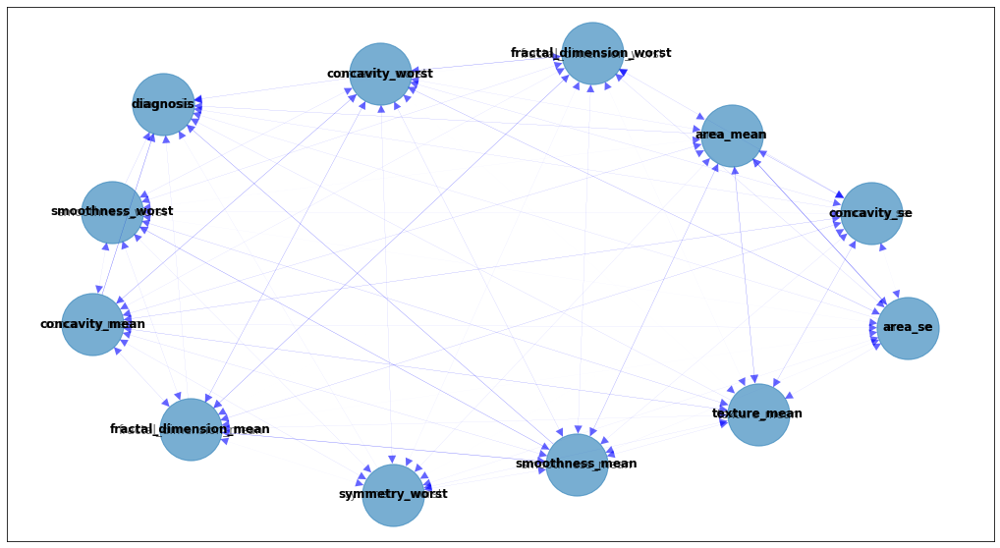

In [143]:
plt.figure(figsize=(18,10))
pos = nx.spring_layout(SM, k=60)
 
edge_width = [ d['weight']*0.3 for (u,v,d) in SM.edges(data=True)]
#nx.draw_networkx_labels(SM, pos, fontsize=16, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx_labels(SM, pos, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx(SM,
                 pos,
                 node_size=4000,
                 arrowsize=20,
                 alpha=0.6,
                 edge_color='b',
                 width=edge_width)

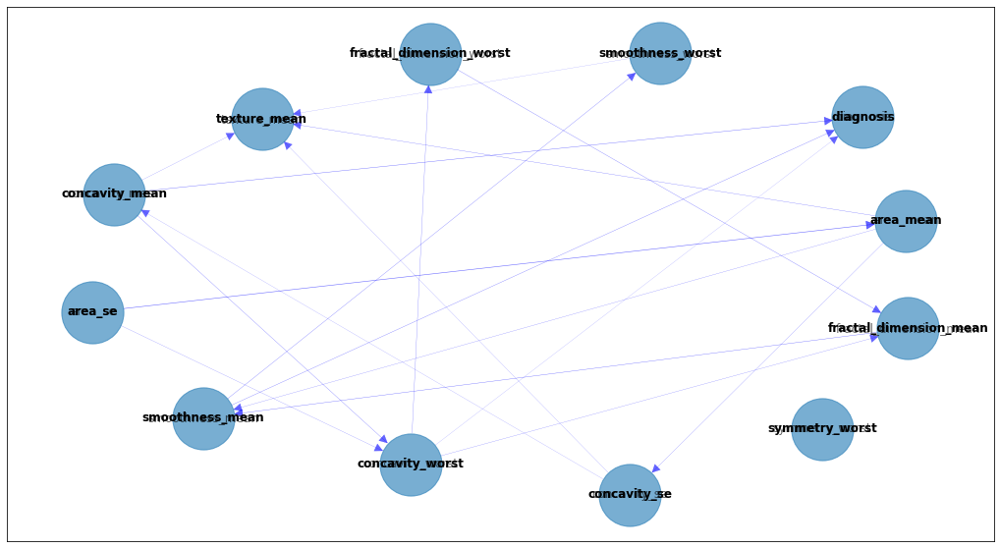

In [144]:
COPY_SM = SM.copy()
 
COPY_SM.remove_edges_below_threshold(0.5)
 
plt.figure(figsize=(18,10))
pos = nx.spring_layout(COPY_SM, k=60)
 
edge_width = [ d['weight']*0.3 for (u,v,d) in COPY_SM.edges(data=True)]
#nx.draw_networkx_labels(COPY_SM, pos, fontsize=16, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx_labels(COPY_SM, pos, font_family="Yu Gothic", font_weight="bold")
nx.draw_networkx(COPY_SM,
                 pos,
                 node_size=4000,
                 arrowsize=20,
                 alpha=0.6,
                 edge_color='b',
                 width=edge_width)

In [145]:
def vis_sm(sm):
    viz = plot_structure( sm, graph_attributes={"scale": "2.0",  
    'size':2.5}, all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
    return Image(viz.draw(format='png'))


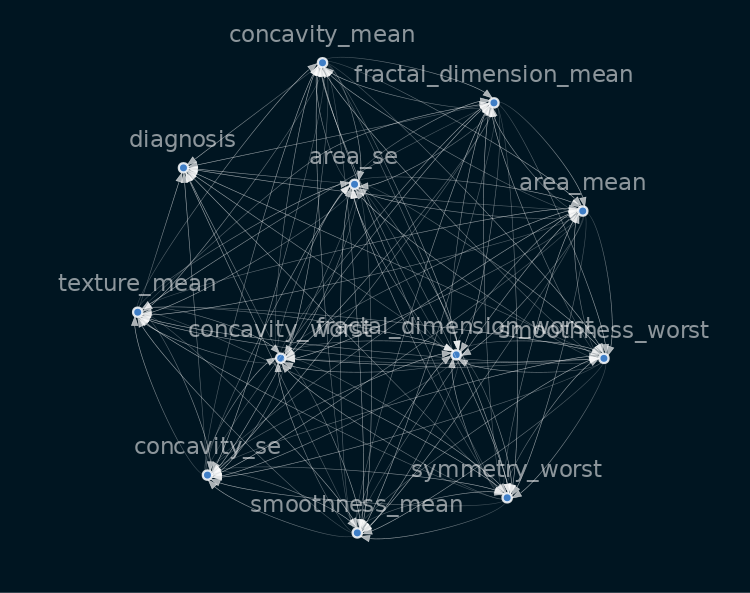

In [146]:
sm = from_pandas(df_feat, tabu_parent_nodes=['diagnosis'],)
vis_sm(sm)

# Data test

In [71]:
df_feat

,texture_mean,area_mean,smoothness_mean,concavity_mean,fractal_dimension_mean,area_se,concavity_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,2.625069,-0.289626,-0.271052,-0.761525,-0.386679,-0.253974,-0.993028,-0.660927,-0.987813,-1.162857,-0.414331,1.0
1,-0.158958,-1.233259,0.758922,-1.110366,1.548578,-0.477184,-1.335150,0.098381,-1.334286,0.474049,-0.155605,1.0
2,1.182520,-0.713137,1.875013,-0.551650,1.614863,-0.414155,-0.531145,1.925059,-0.644110,-0.112538,0.932096,1.0
4,-0.011947,-0.161281,-1.134989,-0.739745,-0.994779,-0.264412,-0.675564,-1.129529,-0.506570,-0.886002,-0.456571,1.0
5,-0.379475,-0.250589,0.214655,-0.547567,-0.282928,-0.420378,-0.603139,-0.543777,-0.472432,-0.605686,-0.833806,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.787427,-0.596868,-1.862516,-0.127447,0.539881,-0.643005,0.520745,-1.928321,0.106425,-1.171509,0.567769,0.0
392,0.456652,-0.991453,-1.048182,-1.079801,0.222862,-0.601836,-1.245740,-0.860517,-1.273184,-0.898115,-0.187873,1.0
393,-0.057888,-0.703870,-0.752624,-0.431616,-0.024989,-0.427202,0.581961,-0.326832,-0.067727,0.288903,-0.057043,1.0
395,-0.204899,-0.481161,-0.858033,-1.087349,-0.618679,-0.384046,-1.254965,-1.242340,-1.306684,-0.628181,-1.144159,0.0


In [15]:
def jaccard_similarity(g, h):
    i = set(g).intersection(h)
    return round(len(i) / (len(g) + len(h) - len(i)), 3)

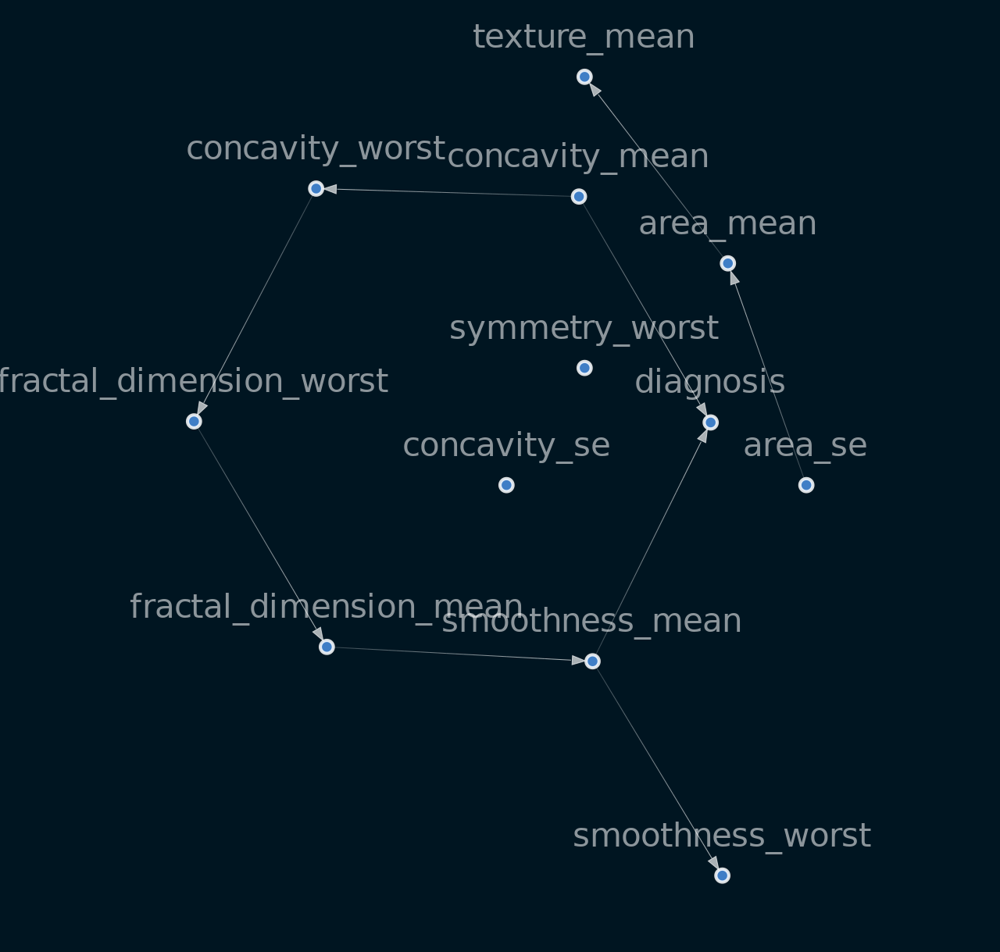

In [148]:
# remove weak network
sm.remove_edges_below_threshold(0.8)
viz = plot_structure(
    sm,
    graph_attributes={"scale": "1.0"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [102]:
# 60% of the data

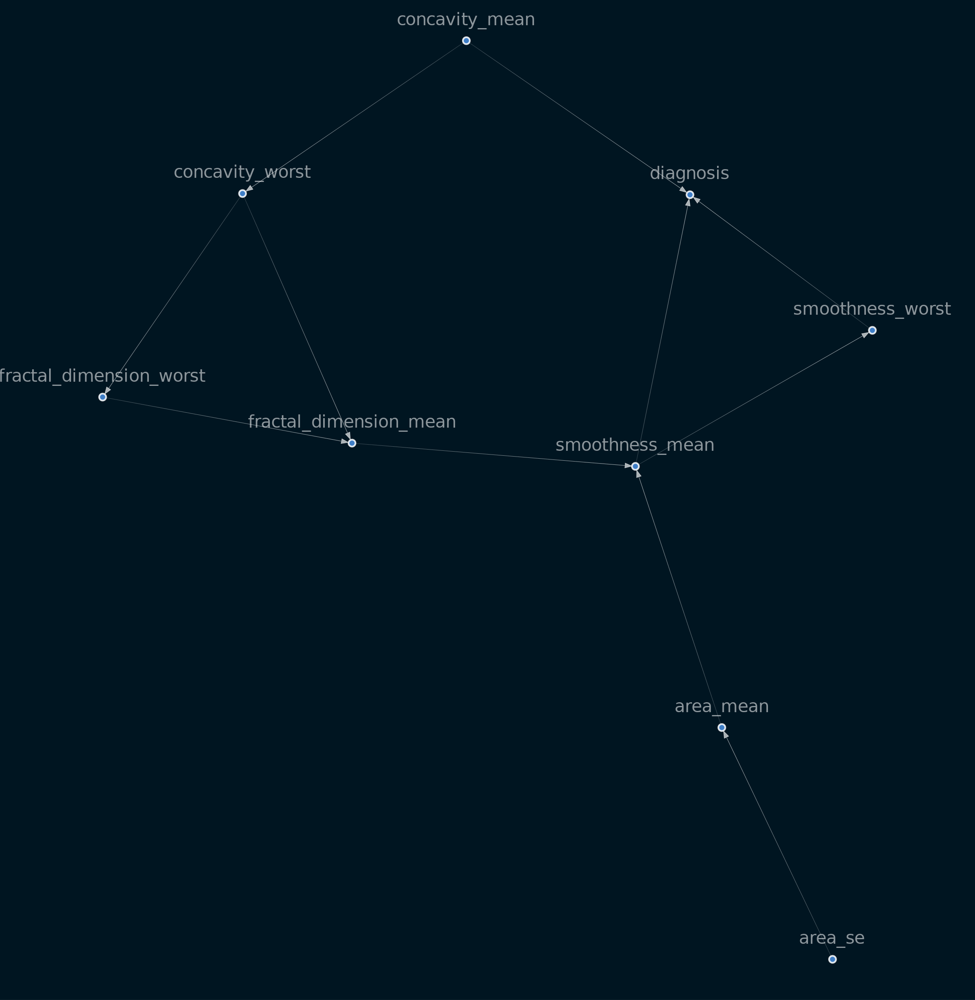

In [39]:
sm2 = from_pandas(df_feat[:int(len(df_feat)*0.6)], tabu_parent_nodes=['diagnosis'],)
sm2.remove_edges_below_threshold(0.8)
sm2 = sm2.get_largest_subgraph()
viz = plot_structure(
    sm2,
    graph_attributes={"scale": "2.0"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [150]:
jaccard_similarity(sm.edges, sm2.edges)

0.667

In [111]:
# 70% of the data

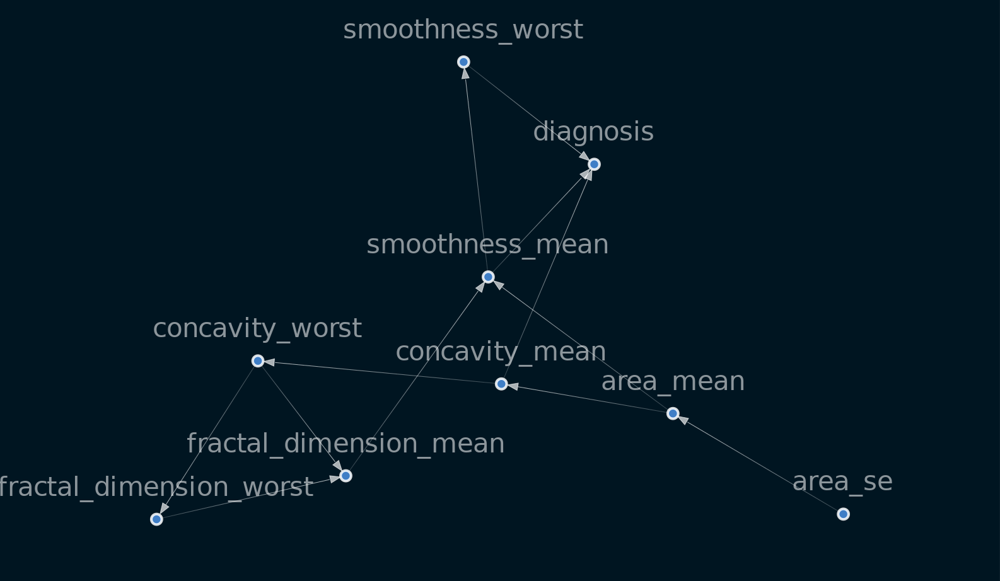

In [40]:
sm3 = from_pandas(df_feat[:int(len(df_feat)*0.7)], tabu_parent_nodes=['diagnosis'],)
sm3.remove_edges_below_threshold(0.8)
sm3 = sm3.get_largest_subgraph()
viz = plot_structure(
    sm3,
    graph_attributes={"scale": "1.0"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [16]:
jaccard_similarity(sm2.edges, sm3.edges)

0.917

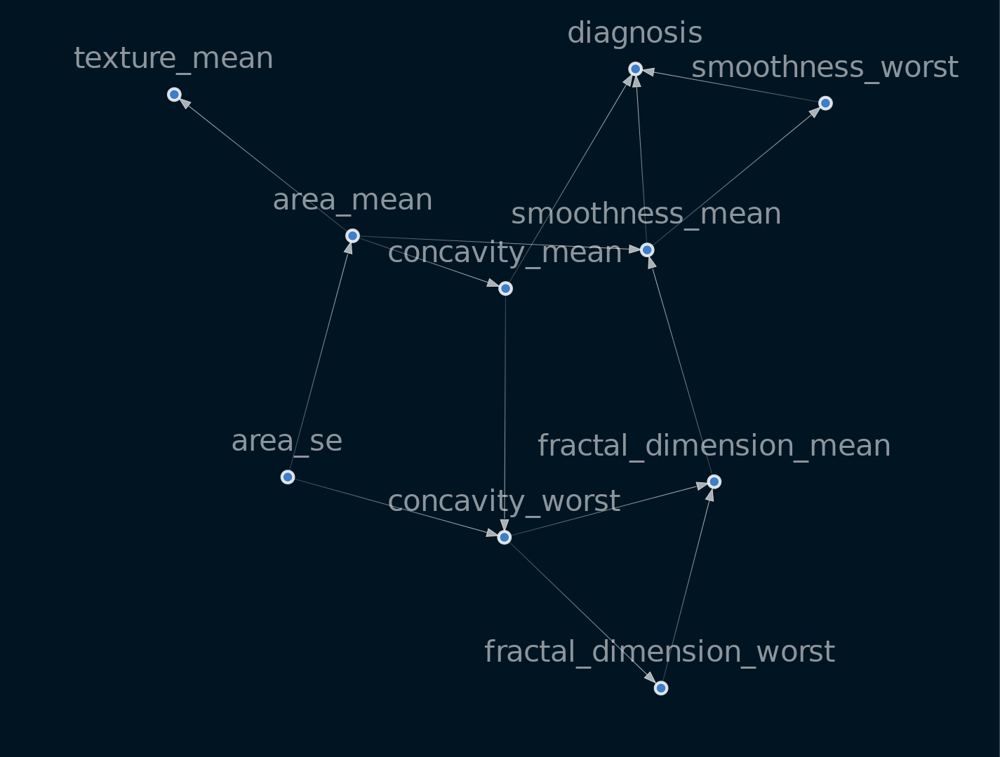

In [153]:
sm4 = from_pandas(df_feat[:int(len(df_feat)*0.8)], tabu_parent_nodes=['diagnosis'],)
sm4.remove_edges_below_threshold(0.8)
sm4 = sm4.get_largest_subgraph()
viz = plot_structure(
    sm4,
    graph_attributes={"scale": "1.0"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [154]:
jaccard_similarity(sm3.edges, sm4.edges)

0.857

In [156]:
# 90% of the data

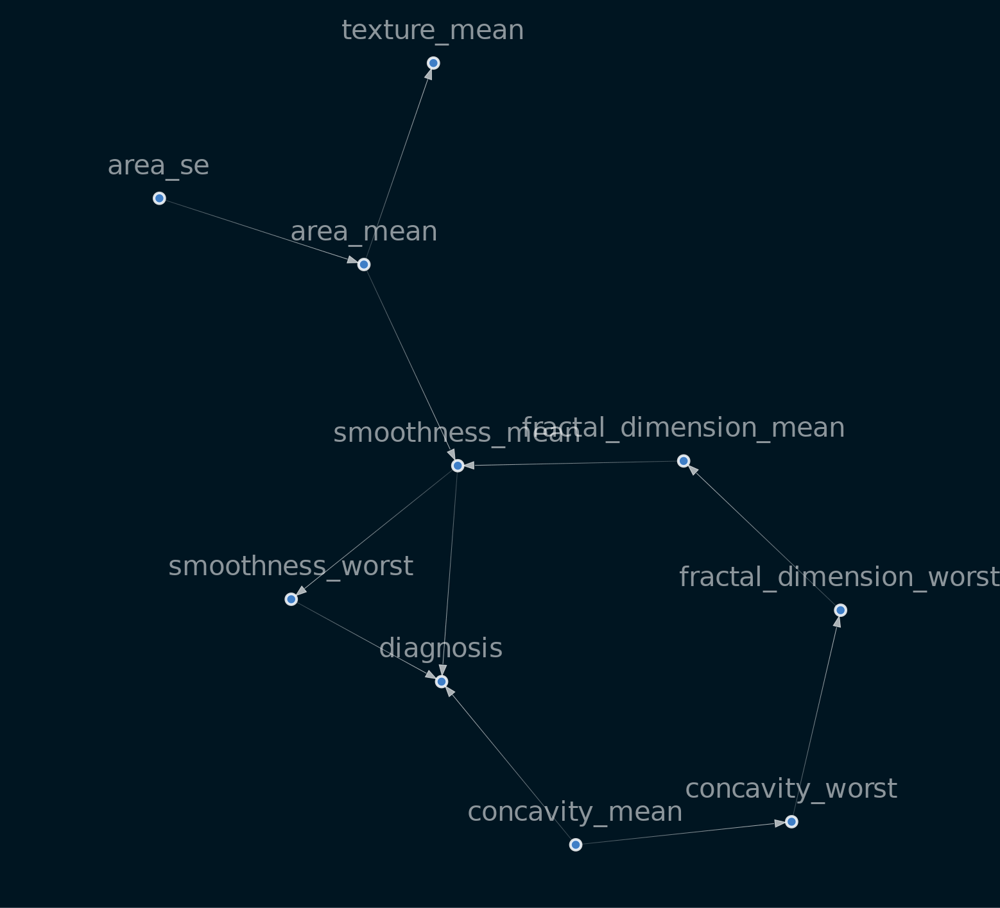

In [155]:
sm5 = from_pandas(df_feat[:int(len(df_feat)*0.9)], tabu_parent_nodes=['diagnosis'],)
sm5.remove_edges_below_threshold(0.8)
sm5 = sm5.get_largest_subgraph()
viz = plot_structure(
    sm5,
    graph_attributes={"scale": "1.0"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [157]:
jaccard_similarity(sm4.edges, sm5.edges)

0.786

In [158]:
# 100% of the data

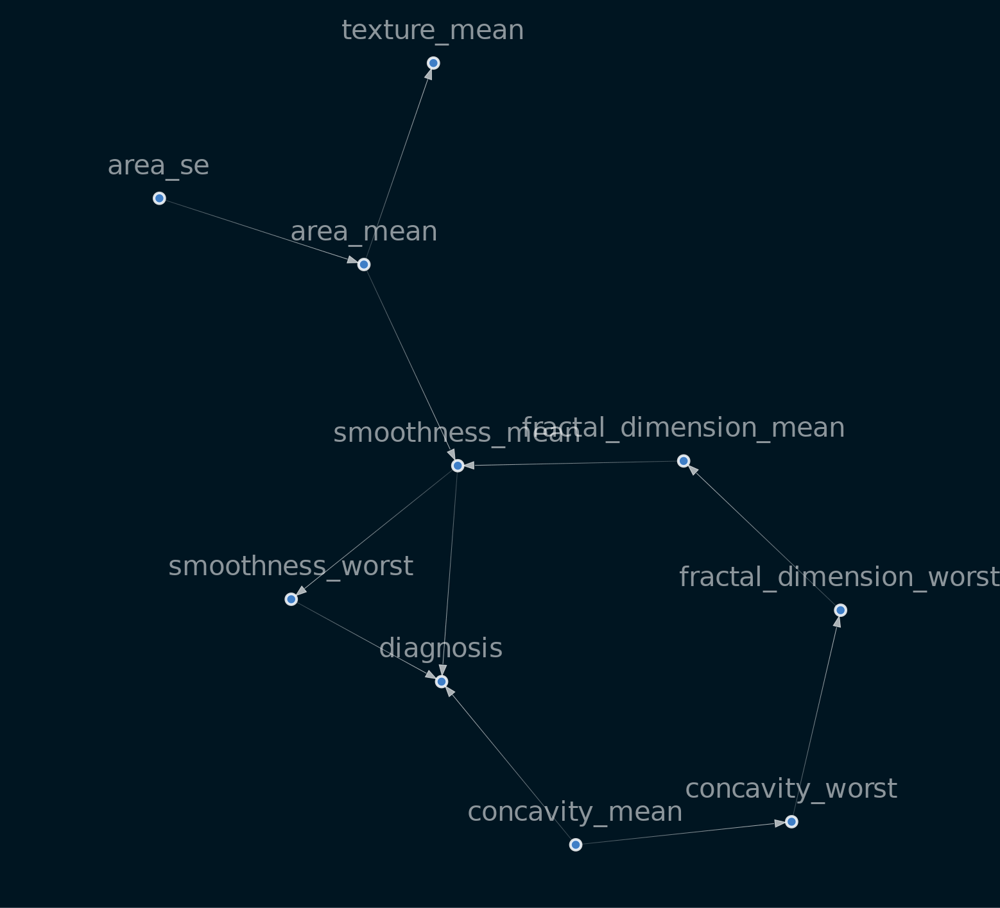

In [159]:
sm6 = from_pandas(df_feat[:int(len(df_feat)*1.0)], tabu_parent_nodes=['diagnosis'],)
sm6.remove_edges_below_threshold(0.8)
sm6 = sm6.get_largest_subgraph()
viz = plot_structure(
    sm5,
    graph_attributes={"scale": "1.0"},
    all_node_attributes=NODE_STYLE.WEAK,
    all_edge_attributes=EDGE_STYLE.WEAK)
Image(viz.draw(format='png'))

In [160]:
jaccard_similarity(sm5.edges, sm6.edges)

0.636

In [41]:
# create bayesian network instance
from causalnex.network import BayesianNetwork

bn = BayesianNetwork(sm3)
edge_list = list(bn.edges)

In [19]:
edge_list

[('area_mean', 'smoothness_mean'),
 ('area_mean', 'concavity_mean'),
 ('smoothness_mean', 'smoothness_worst'),
 ('smoothness_mean', 'diagnosis'),
 ('concavity_mean', 'concavity_worst'),
 ('concavity_mean', 'diagnosis'),
 ('smoothness_worst', 'diagnosis'),
 ('concavity_worst', 'fractal_dimension_mean'),
 ('concavity_worst', 'fractal_dimension_worst'),
 ('fractal_dimension_mean', 'smoothness_mean'),
 ('area_se', 'area_mean'),
 ('fractal_dimension_worst', 'fractal_dimension_mean')]

In [20]:
# Bayesian Networks in CausalNex support only discrete distributions.
# So change to continuous value to discrete values and distributions

col = df_feat.columns
col

Index(['texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean',
       'fractal_dimension_mean', 'area_se', 'concavity_se', 'smoothness_worst',
       'concavity_worst', 'symmetry_worst', 'fractal_dimension_worst',
       'diagnosis'],
      dtype='object')

In [21]:
# library for make dsicrete value
from causalnex.discretiser import Discretiser

df_c = df_feat.copy()

for i in range(len(col)):
    c = col[i]
    df_c[c] = Discretiser(method="fixed",
                          numeric_split_points=[df_c[c].quantile(0.5)]).transform(df_c[c].values)

In [22]:
df_c

,texture_mean,area_mean,smoothness_mean,concavity_mean,fractal_dimension_mean,area_se,concavity_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,1,1,0,0,0,1,0,0,0,0,0,1
1,0,0,1,0,1,0,0,1,0,1,1,1
2,1,0,1,0,1,0,0,1,0,0,1,1
4,1,1,0,0,0,1,0,0,0,0,0,1
5,0,1,1,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
391,1,0,0,1,1,0,1,0,1,0,1,1
392,1,0,0,0,1,0,0,0,0,0,1,1
393,1,0,0,0,1,0,1,0,1,1,1,1
395,0,0,0,0,0,0,0,0,0,0,0,1


In [23]:
df_feat

,texture_mean,area_mean,smoothness_mean,concavity_mean,fractal_dimension_mean,area_se,concavity_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,0.871784,0.162155,0.359484,0.066050,0.226365,0.041330,0.051700,0.312640,0.072887,0.149917,0.232044,1.0
1,0.368880,0.017328,0.494448,0.000000,0.524412,0.020560,0.000000,0.431502,0.000000,0.374673,0.279179,1.0
2,0.611203,0.097155,0.640697,0.105787,0.534621,0.026425,0.121498,0.717449,0.145192,0.294132,0.477341,1.0
4,0.395436,0.181853,0.246276,0.070173,0.132712,0.040359,0.099674,0.239285,0.174126,0.187931,0.224348,1.0
5,0.329046,0.168147,0.423129,0.106560,0.242344,0.025846,0.110619,0.330979,0.181307,0.226420,0.155622,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.539834,0.115000,0.150943,0.186106,0.369063,0.005131,0.280456,0.114243,0.303081,0.148729,0.410966,0.0
392,0.480083,0.054440,0.257651,0.005787,0.320240,0.008962,0.013511,0.281396,0.012854,0.186268,0.273301,1.0
393,0.387137,0.098578,0.296380,0.128515,0.282068,0.025211,0.289707,0.364939,0.266445,0.349252,0.297136,1.0
395,0.360581,0.132759,0.282567,0.004358,0.190635,0.029227,0.012117,0.221626,0.005807,0.223331,0.099081,0.0


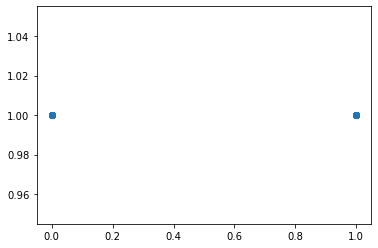

In [24]:
plt.scatter(df_feat['diagnosis'], df_c['diagnosis'])

In [25]:
features_cx = ['concavity_mean','smoothness_worst','smoothness_mean']

In [26]:
from causalnex.discretiser.discretiser_strategy import ( DecisionTreeSupervisedDiscretiserMethod )
tree_discretiser = DecisionTreeSupervisedDiscretiserMethod(
    mode='single',
    tree_params={'max_depth': 3, 'random_state': 27},
)
tree_discretiser.fit(
    feat_names=features_cx,
    dataframe=df_feat,
    target_continuous=True,
    target='diagnosis',
)
discretised_data = df_feat.copy()
for col in features_cx:
    discretised_data[col] = tree_discretiser.transform(df_feat[[col]])

In [27]:
discretised_data

,texture_mean,area_mean,smoothness_mean,concavity_mean,fractal_dimension_mean,area_se,concavity_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,0.871784,0.162155,6,6,0.226365,0.041330,0.051700,1,0.072887,0.149917,0.232044,1.0
1,0.368880,0.017328,6,0,0.524412,0.020560,0.000000,3,0.000000,0.374673,0.279179,1.0
2,0.611203,0.097155,6,6,0.534621,0.026425,0.121498,6,0.145192,0.294132,0.477341,1.0
4,0.395436,0.181853,2,6,0.132712,0.040359,0.099674,1,0.174126,0.187931,0.224348,1.0
5,0.329046,0.168147,6,6,0.242344,0.025846,0.110619,1,0.181307,0.226420,0.155622,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.539834,0.115000,0,6,0.369063,0.005131,0.280456,1,0.303081,0.148729,0.410966,0.0
392,0.480083,0.054440,2,2,0.320240,0.008962,0.013511,1,0.012854,0.186268,0.273301,1.0
393,0.387137,0.098578,4,6,0.282068,0.025211,0.289707,1,0.266445,0.349252,0.297136,1.0
395,0.360581,0.132759,3,1,0.190635,0.029227,0.012117,1,0.005807,0.223331,0.099081,0.0


In [32]:
from sklearn.model_selection import train_test_split
train, test = train_test_split( discretised_data, train_size=0.8, test_size=0.2, random_state=27)
bn = BayesianNetwork(bn.structure)
bn = bn.fit_node_states(discretised_data)
bn = bn.fit_cpds(train, method="BayesianEstimator", bayes_prior="K2")

In [29]:
# 1st, The first step in this is specifying all of the states that each node can take.
bn = bn.fit_node_states(df_c)

In [33]:
bn.cpds["diagnosis"]

concavity_mean           0                                                    \
smoothness_mean          0                                       1             
smoothness_worst         0         1    2    3    4    5    6    0         1   
diagnosis                                                                      
0.0               0.333333  0.666667  0.5  0.5  0.5  0.5  0.5  0.5  0.333333   
1.0               0.666667  0.333333  0.5  0.5  0.5  0.5  0.5  0.5  0.666667   

concavity_mean         ...         6                                          \
smoothness_mean        ...         6                        7                  
smoothness_worst    2  ...         4         5         6    0    1    2    3   
diagnosis              ...                                                     
0.0               0.5  ...  0.333333  0.866667  0.555556  0.5  0.5  0.5  0.5   
1.0               0.5  ...  0.666667  0.133333  0.444444  0.5  0.5  0.5  0.5   

concavity_mean                   
smoothness_mean                  
smoothness_worst    4    5    6  
diagnosis                        
0.0               0.5  0.5  0.2  
1.0               0.5  0.5  0.8  

[2 rows x 392 columns]

In [34]:
import joblib

# save
joblib.dump(bn, "../models/model_bn.pkl") 

# load
bn2 = joblib.load("../models/model_bn.pkl")

predictions = bn2.predict(test, "diagnosis")

In [35]:
predictions[:10]

,diagnosis_prediction
4,0.0
80,0.0
217,0.0
277,0.0
337,0.0
309,1.0
12,0.0
321,0.0
360,0.0
316,0.0


In [217]:
test['diagnosis'][:10]

4      1.0
80     0.0
217    0.0
277    1.0
337    1.0
309    0.0
12     1.0
321    1.0
360    0.0
316    0.0
Name: diagnosis, dtype: float64

In [200]:
# accuracy score etc.
from causalnex.evaluation import classification_report
classification_report(bn, test, "diagnosis")

{'diagnosis_0.0': {'precision': 0.6829268292682927,
  'recall': 0.8235294117647058,
  'f1-score': 0.7466666666666667,
  'support': 34},
 'diagnosis_1.0': {'precision': 0.6,
  'recall': 0.4090909090909091,
  'f1-score': 0.4864864864864865,
  'support': 22},
 'accuracy': 0.6607142857142857,
 'macro avg': {'precision': 0.6414634146341464,
  'recall': 0.6163101604278075,
  'f1-score': 0.6165765765765766,
  'support': 56},
 'weighted avg': {'precision': 0.6503484320557492,
  'recall': 0.6607142857142857,
  'f1-score': 0.6444530244530245,
  'support': 56}}

In [198]:
from causalnex.evaluation import roc_auc
roc, auc = roc_auc(bn, test, "diagnosis")
print(auc)

0.7146045918367346


# various images

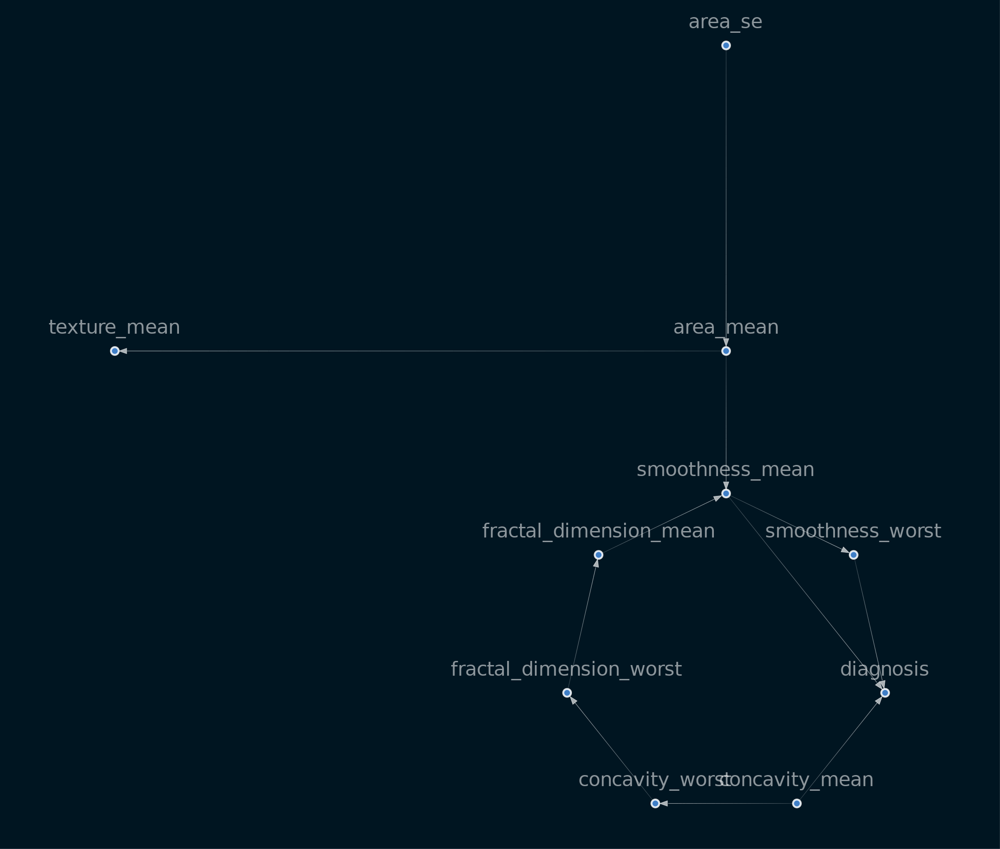

In [205]:
Image(viz.draw(
    format="png", prog="circo"  # `circo` produces a circular layout
),width=500)

dot: Order nodes hierarchly. Great to spot the dependencies of a causal network.


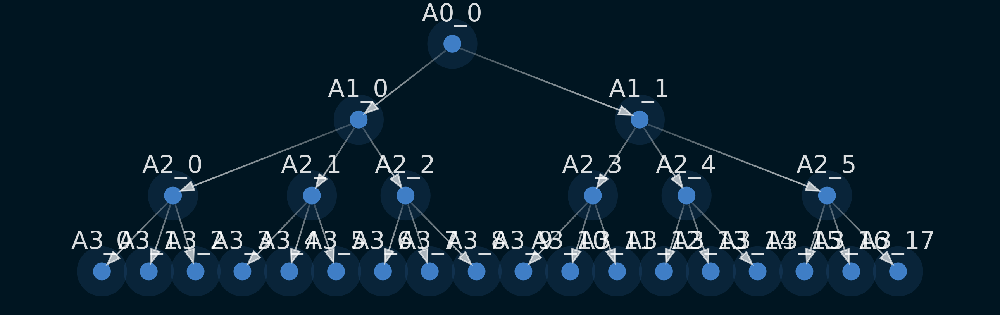

neato: Spring model. Great default tool if the graph is not too large


sfdp: A different style of spring model


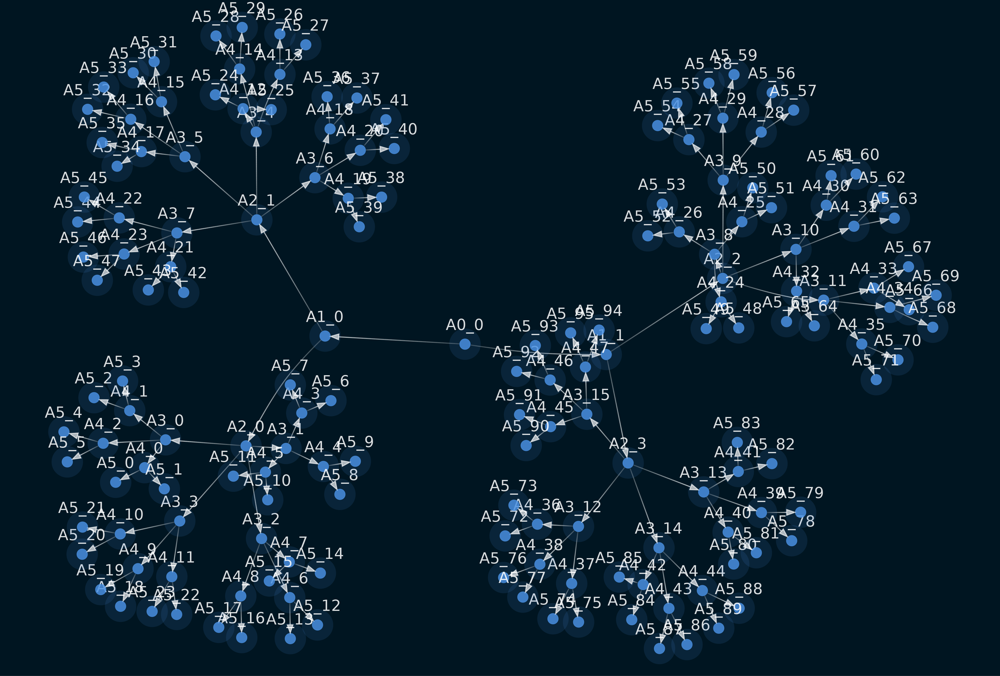

twopi: Radial layout


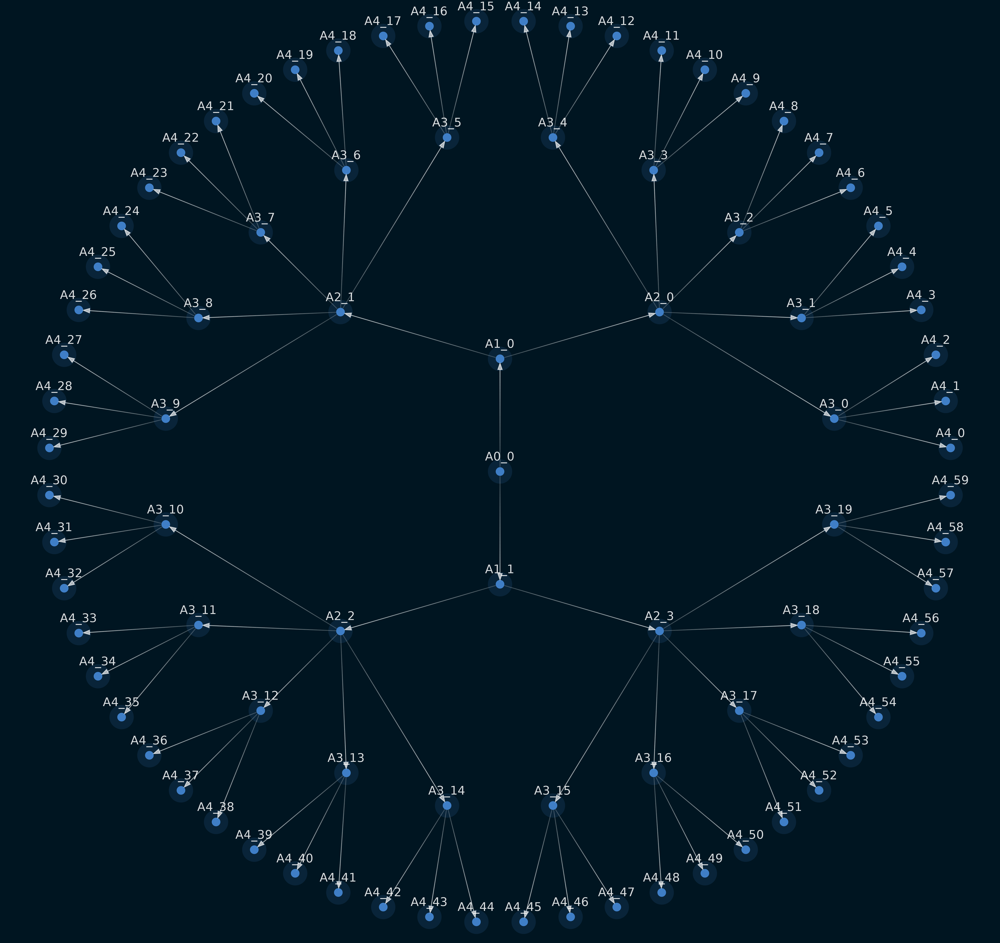

In [206]:
def get_tree(k_list):
    """
    Return the edges of a tree given the number of children at each level
    """
    n = 1
    edges_radial = []
    for level in range(0, len(k_list)):
        k = k_list[level]
        edges_radial.extend(
            [(f"A{level}_{i // k}", f"A{level + 1}_{i}") for i in range(k * n)]
        )
        n = k * n
    return edges_radial


layouts = [
    ("dot","Order nodes hierarchly. Great to spot the dependencies of a causal network.",[2, 3, 3]),
    ("neato", "Spring model. Great default tool if the graph is not too large", [2, 2, 4, 3, 2]),
    ("sfdp", "A different style of spring model", [2, 2, 4, 3, 2]),
    ("twopi", "Radial layout", [2, 2, 5, 3]),
]

for layout, description, k_list in layouts:
    g_tree = StructureModel(get_tree(k_list))
    viz = plot_structure(g_tree)

    print(f"{layout}: {description}")
    image_binary = viz.draw(format="png", prog=layout)
    display(Image(image_binary, width=500))

texture_mean
area_mean
smoothness_mean
concavity_mean
fractal_dimension_mean
area_se
concavity_se
smoothness_worst
concavity_worst
symmetry_worst
fractal_dimension_worst
diagnosis


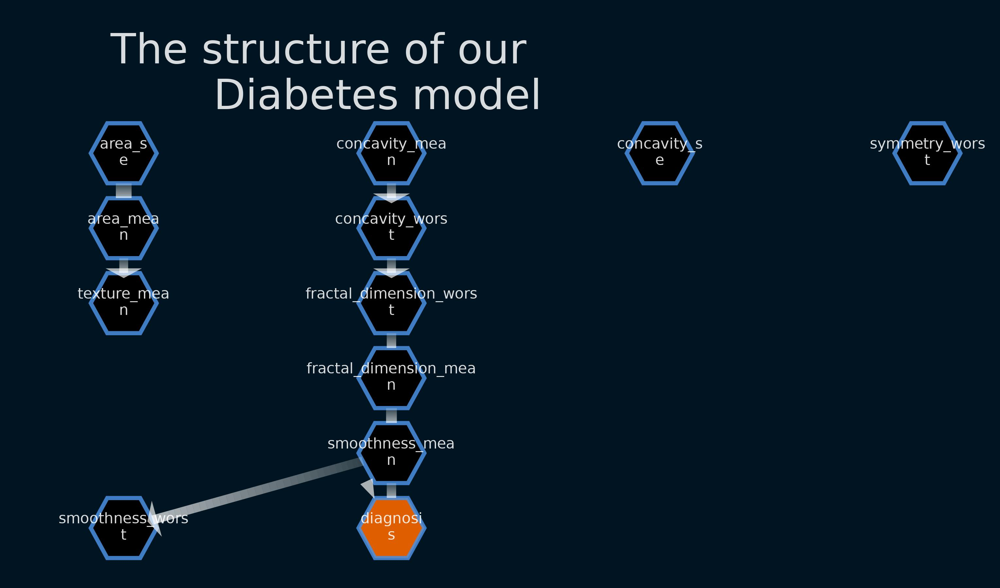

In [213]:
graph_attributes = {
    "splines": "spline",  # I use splies so that we have no overlap
    "ordering": "out",
    "ratio": "fill",  # This is necessary to control the size of the image
    "size": "16,9!",  # Set the size of the final image. (this is a typical presentation size)
    "label": "The structure of our\n \t Diabetes model",
    "fontcolor": "#FFFFFFD9",
    "fontname": "Helvetica",
    "fontsize": 100,
    "labeljust": "l",
    "labelloc": "t",
    "pad": "1,1",
    "dpi": 200,
    "nodesep": 0.8,
    "ranksep": ".5 equally",
}

# Making all nodes hexagonal with black coloring
node_attributes = {
    node: {
        "shape": "hexagon",
        "width": 2.2,
        "height": 2,
        "fillcolor": "#000000",
        "penwidth": "10",
        "color": "#4a90e2d9",
        "fontsize": 35,
        "labelloc": "c",
    }
    for node in sm.nodes
}

# Splitting two words with "\n"
for node in sm.nodes:
    print(node)
    up_idx = [i for i, c in enumerate(node)][-1]
    node_attributes[node]["label"] = node[:up_idx] + "\n" + node[up_idx:]

# Target nodes (ones with "Cost" in the name) are colored differently
for node in sm.nodes:
    if "diagnosis" in node:  # We color nodes with "cost" in the name with a orange colour.
        node_attributes[node]["fillcolor"] = "#DF5F00"

# Customising edges
edge_attributes = {
    (u, v): {
        "penwidth": w * 20 + 2,  # Setting edge thickness
        "weight": int(5 * w),  # Higher "weight"s mean shorter edges
        "arrowsize": 2 - 2.0 * w,  # Avoid too large arrows
        "arrowtail": "dot",
    }
    for u, v, w in sm.edges(data="weight")
}


viz = plot_structure(
    sm,
    prog="dot",
    graph_attributes=graph_attributes,
    node_attributes=node_attributes,
    edge_attributes=edge_attributes,
)
f = "../images/final_model.jpg"
viz.draw(f)
Image(f)